<a href="https://colab.research.google.com/github/DiploDatos/AnalisisYCuracion/blob/master/Entregable_Parte_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Diplomatura en Ciencia de Datos, Aprendizaje Automático y sus Aplicaciones**

**Exploración y Curación de Datos**

*Edición 2021*

----

# Trabajo práctico entregable - parte 1

En esta notebook, vamos a cargar el conjunto de datos de [la compentencia Kaggle](https://www.kaggle.com/dansbecker/melbourne-housing-snapshot) sobre estimación de precios de ventas de propiedades en Melbourne, Australia.

Utilizaremos el conjunto de datos reducido producido por [DanB](https://www.kaggle.com/dansbecker). Hemos subido una copia a un servidor de la Universidad Nacional de Córdoba para facilitar su acceso remoto.

In [1]:
import matplotlib.pyplot as plt
import numpy
import pandas

import pandas_profiling
import seaborn
seaborn.set_context('talk')


In [2]:
import plotly
plotly.__version__
# Make sure it's 4.14.3

'4.14.3'

In [3]:
# To update plotly, uncomment and run the following line:
# !pip install plotly --upgrade

## Ejercicio 1: 

1. Eliminar los valores extremos que no sean relevantes para la predicción de valores de las propiedades.

1. Investigar la distribución de las variables del conjunto de datos y seleccionar un subconjunto de columnas que les parezcan relevantes al problema de predicción del valor de la propiedad.
  1. Justificar cada columna no seleccionada.
  2. Para las variables categóricas seleccionadas, agrupe o combine las categorías poco frecuentes para asegurar que todos los grupos tengan un número mínimo de registros.

2. Agregar información adicional respectiva al entorno de una propiedad a partir del [conjunto de datos de AirBnB](https://www.kaggle.com/tylerx/melbourne-airbnb-open-data?select=cleansed_listings_dec18.csv) utilizado en el práctico. 
  1. Seleccionar qué variables agregar y qué combinaciones aplicar a cada una. Por ejemplo, pueden utilizar solo la columna `price`, o aplicar múltiples transformaciones como la mediana o el mínimo.
  1. Utilizar la variable zipcode para unir los conjuntos de datos. Sólo incluir los zipcodes que tengan una cantidad mínima de registros (a elección) como para que la información agregada sea relevante.
  2. Investigar al menos otras 2 variables que puedan servir para combinar los datos, y justificar si serían adecuadas o no. Pueden asumir que cuentan con la ayuda de anotadores expertos para encontrar equivalencias entre barrios o direcciones, o que cuentan con algoritmos para encontrar las n ubicaciones más cercanas a una propiedad a partir de sus coordenadas geográficas. **NO** es necesario que realicen la implementación.

Pueden leer otras columnas del conjunto de AirBnB además de las que están en `interesting_cols`, si les parecen relevantes.


In [4]:
melb_df = pandas.read_csv(
    'https://cs.famaf.unc.edu.ar/~mteruel/datasets/diplodatos/melb_data.csv')
melb_df[:3]

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,...,1.0,1.0,202.0,NaN,NaN,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067.0,...,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067.0,...,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0


In [5]:
melb_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13580 entries, 0 to 13579
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Suburb         13580 non-null  object 
 1   Address        13580 non-null  object 
 2   Rooms          13580 non-null  int64  
 3   Type           13580 non-null  object 
 4   Price          13580 non-null  float64
 5   Method         13580 non-null  object 
 6   SellerG        13580 non-null  object 
 7   Date           13580 non-null  object 
 8   Distance       13580 non-null  float64
 9   Postcode       13580 non-null  float64
 10  Bedroom2       13580 non-null  float64
 11  Bathroom       13580 non-null  float64
 12  Car            13518 non-null  float64
 13  Landsize       13580 non-null  float64
 14  BuildingArea   7130 non-null   float64
 15  YearBuilt      8205 non-null   float64
 16  CouncilArea    12211 non-null  object 
 17  Lattitude      13580 non-null  float64
 18  Longti

# EJERCICIO 1.1 y 1.2

## EXPLORACIÓN DE LAS VARIABLES

Con la función profiling podemos ver todas las variables en el dataset, las categorías más frecuentes, la distribución en las que son numéricas, los datos faltantes y las relaciones entre variables. Con esto podemos empezar a identificar cuáles serán las variables que nos van a servir y también cuáles necesitaremos evaluar más en profundidad para la detección de outliers. 

**Las principales conclusiones extraidas de esta exploración se encuentran en la documentación en la sección: Criterios de Inclusión y Exclusión de Variables**

In [6]:
#Acá tenemos un perfil de todas las variables.
pandas_profiling.ProfileReport(melb_df)

Summarize dataset:   0%|          | 0/34 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

A partir de esta exploración descartamos algunas variables por no ser relevantes y otras por ser redundantes (ver documentación). Abajo están correlaciones entre variables (a partir de esto decidimos eliminar Bedroom2). 

In [7]:
#Si bien en la exploración anterior señala cuáles son las variables muy correlacionadas, estimamos la correlación entre
#algunas de las que refieren a tamaño y distribución de la propiedad. 
print('Correlación Spearman Rooms y Bedroom: ', melb_df['Rooms'].corr(melb_df['Bedroom2'], method='spearman'))
print('Correlación Spearman Rooms y Bathroom: ', melb_df['Rooms'].corr(melb_df['Bathroom'], method='spearman'))
print('Correlación Spearman Rooms y Cars: ', melb_df['Rooms'].corr(melb_df['Car'], method='spearman'))
print('Correlación Spearman Rooms y Landsize: ', melb_df['Rooms'].corr(melb_df['Landsize'], method='spearman'))

Correlación Spearman Rooms y Bedroom:  0.9596678439485257
Correlación Spearman Rooms y Bathroom:  0.5868597891399305
Correlación Spearman Rooms y Cars:  0.476219228501354
Correlación Spearman Rooms y Landsize:  0.4857416778968965


## EXPLORACIÓN DE CASOS ATÍPICOS y GENERACIÓN DE CATEGORÍAS

### Ambientes, Baños y Cocheras

A continuación hay una exploración de las variables **ambientes (rooms), baños y cocheras**, para poder ver los casos atípicos 

In [8]:
df_sub = melb_df [[ "Rooms", "Bathroom", "Car"]]
df_sub.describe()

,Rooms,Bathroom,Car
count,13580.000000,13580.000000,13518.000000
mean,2.937997,1.534242,1.610075
std,0.955748,0.691712,0.962634
min,1.000000,0.000000,0.000000
25%,2.000000,1.000000,1.000000
50%,3.000000,1.000000,2.000000
75%,3.000000,2.000000,2.000000
max,10.000000,8.000000,10.000000


In [9]:
df_sub.median()

Rooms       3.0
Bathroom    1.0
Car         2.0
dtype: float64

#### Bathroom

¿Qué hacemos con los 0 baños? Es extraño que una propiedad tenga 0 baños y dos dormitorios o más. También es extraño que hayan propiedades con 6, 7 u 8 baños (aunque, en general, coincide con las de mayor cantidad de ambientes).

En principio, **podemos asumir que los casos que tienen 0 baños son un error, porque todas son construcciones (ninguna es un terreno)**. Siendo pocos casos, podríamos eliminarlos o podemos reemplazarlos por 1 que es la mediana. 

Además de eso, podemos recategorizar esta variable para agrupar los casos que tienen 3 o más baños, garantizando que cada categoría tenga un número mínimo de casos. 

In [10]:
pandas.crosstab(melb_df.Bathroom, melb_df.Rooms)

Rooms,1,2,3,4,5,6,7,8,10
Bathroom,,,,,,,,,
0.0,1,19,11,3,0,0,0,0,0
1.0,674,3117,3250,452,17,2,0,0,0
2.0,6,504,2459,1720,260,20,3,2,0
3.0,0,8,153,469,244,35,5,2,1
4.0,0,0,5,41,47,9,2,2,0
5.0,0,0,1,2,25,0,0,0,0
6.0,0,0,2,0,2,1,0,0,0
7.0,0,0,0,0,1,0,0,1,0
8.0,0,0,0,1,0,0,0,1,0


In [11]:
#Categorización de la variable baño
def bath_groups(series):
    if series < 2:
        return "1"
    elif 2 <= series < 3:
        return "2"
    elif 3 <= series:
        return "3 o más"

melb_df['Bathroom_group'] = melb_df['Bathroom'].apply(bath_groups)

melb_df['Bathroom_group'].value_counts(sort=False)

1          7546
3 o más    1060
2          4974
Name: Bathroom_group, dtype: int64

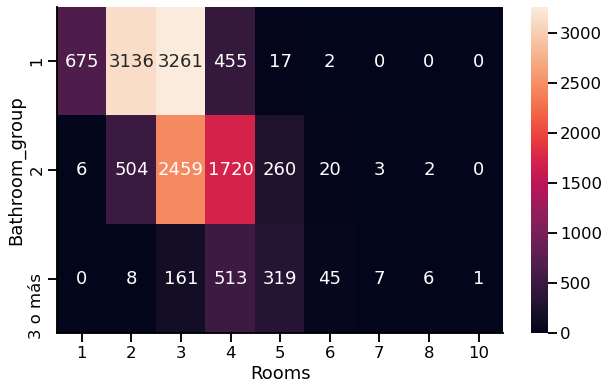

In [12]:
#vemos si el resultado de la categorización tiene sentido asociándola con la cantidad de ambientes
fig = plt.figure(figsize=(10,6))
exp = pandas.crosstab(melb_df.Bathroom_group,
                  melb_df.Rooms)
seaborn.heatmap(exp, annot=True, fmt='g')
seaborn.despine()

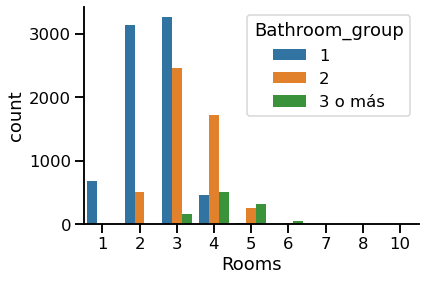

In [13]:
fig = plt.figure(figsize=(6,4))
seaborn.countplot(data=melb_df, x="Rooms", hue="Bathroom_group")
seaborn.despine()

#### Ambientes (Rooms)

Con respecto a la cantidad de ambientes, une podría pensar que estos casos muy atípicos no van a servir para predecir el valor de una casa en melbourne y podrían sacarse. También es posible agruparlos en un número menor de categorías.

In [14]:
melb_df.Rooms.value_counts()

3     5881
2     3648
4     2688
1      681
5      596
6       67
7       10
8        8
10       1
Name: Rooms, dtype: int64

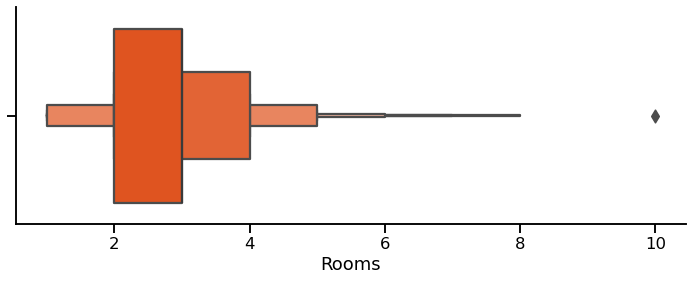

In [15]:
#Solo el caso de 10 ambientes se identifica como atípico
fig = plt.figure(figsize=(12,4))
seaborn.boxenplot(data=melb_df, x="Rooms", 
                color='orangered')
seaborn.despine()

Vamos a seguir la estrategia de **generar categorías sin eliminar casos**, ya que de 5 o más ambientes hay comparativamente muy pocos casos.
En este caso, **agrupar el resto de las categorías inferiores podría ser problemático**, no es lo mismo un monoambiente, 
que dos ambientes o que 3. En consecuencia, las mantendremos independientes. 

In [16]:
def Rooms_groups(series):
    if series == 1:
        return "1"
    elif 2 <= series < 3:
        return "2"
    elif 3 <= series < 4:
        return "3"
    elif 4 <= series < 5:
        return "4"
    elif 5 <= series:
        return "5 o más"

melb_df['Rooms_group'] = melb_df['Rooms'].apply(Rooms_groups)

melb_df['Rooms_group'].value_counts(sort=False)

4          2688
1           681
5 o más     682
3          5881
2          3648
Name: Rooms_group, dtype: int64

#### Cocheras (Car)

Finalmente exploramos la **distribución de esta variable y su asociación con la variable Rooms** que tenemos como parámetro del tamaño de la propiedad. Hay **pocos casos de más de 3 espacios**. Hay algunos casos extraños (como 9 o 10 espacios para autos), pero son muy pocos casos y, además, se podría pensar que son casas con parque o casos así.

In [17]:
melb_df.Car.value_counts()

2.0     5591
1.0     5509
0.0     1026
3.0      748
4.0      506
5.0       63
6.0       54
8.0        9
7.0        8
10.0       3
9.0        1
Name: Car, dtype: int64

In [18]:
pandas.crosstab(melb_df.Car, melb_df.Rooms)

Rooms,1,2,3,4,5,6,7,8,10
Car,,,,,,,,,
0.0,101,424,397,90,12,1,1,0,0
1.0,562,2446,1987,459,49,4,1,1,0
2.0,11,652,2837,1658,391,38,3,0,1
3.0,1,70,359,244,61,10,1,2,0
4.0,3,24,216,181,62,11,4,5,0
5.0,0,2,19,30,12,0,0,0,0
6.0,0,4,29,11,8,2,0,0,0
7.0,0,0,2,4,1,1,0,0,0
8.0,0,0,4,5,0,0,0,0,0


Hacemos una categorización similar a las variables anteriores (Baños y Rooms). 

In [19]:
def car_groups(series):
    if series == 0:
        return "0"
    elif series == 1:
        return "1"
    elif series == 2:
        return "2"
    elif 3 <= series:
        return "3 o más"

melb_df['Car_group'] = melb_df['Car'].apply(car_groups)

melb_df['Car_group'].value_counts(sort=False)

1          5509
3 o más    1392
0          1026
2          5591
Name: Car_group, dtype: int64

In [20]:
#Acá vemos las 3 variables agregadas al final 
melb_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13580 entries, 0 to 13579
Data columns (total 24 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Suburb          13580 non-null  object 
 1   Address         13580 non-null  object 
 2   Rooms           13580 non-null  int64  
 3   Type            13580 non-null  object 
 4   Price           13580 non-null  float64
 5   Method          13580 non-null  object 
 6   SellerG         13580 non-null  object 
 7   Date            13580 non-null  object 
 8   Distance        13580 non-null  float64
 9   Postcode        13580 non-null  float64
 10  Bedroom2        13580 non-null  float64
 11  Bathroom        13580 non-null  float64
 12  Car             13518 non-null  float64
 13  Landsize        13580 non-null  float64
 14  BuildingArea    7130 non-null   float64
 15  YearBuilt       8205 non-null   float64
 16  CouncilArea     12211 non-null  object 
 17  Lattitude       13580 non-null 

### Price

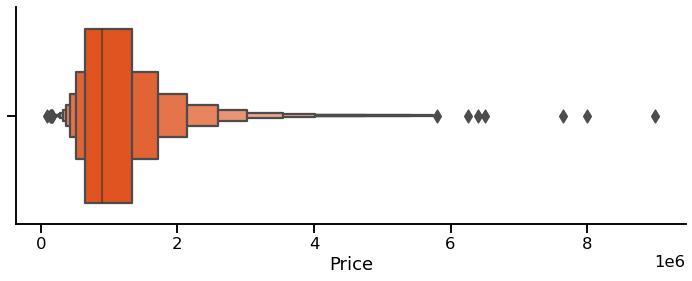

In [21]:
#Detectamos outliers en el precio. Es posible que los casos atípicos aporten confusión a un modelo predictivo
fig = plt.figure(figsize=(12,4))
seaborn.boxenplot(data=melb_df, x="Price", 
                color='orangered')
seaborn.despine()

Para la **detección y eliminación de outilers utilizaremos el rango intercuartílico**, aplicando la fórmula más conservadores (**3 veces el rango intercuatílico**), así eliminamos la menor cantidad de casos posible y evitamos quitar casos que sirvan al objetivo de este estudio 

In [22]:
q1 = melb_df.Price.quantile(.25)
q3= melb_df.Price.quantile(.75)
iqr = q3 - q1
lower_bound = q1 -(3 * iqr) 
upper_bound = q3 +(3 * iqr) 

print ("el límite inferior es", lower_bound)
print ("el límite superior es", upper_bound)

el límite inferior es -1390000.0
el límite superior es 3370000.0


In [23]:
#acá quito los atípicos usando un método conservardor de estimación
max_limit = 3370000
melb_df2 = melb_df[(melb_df["Price"]<=max_limit)]
melb_df2.Price.describe()

count    1.344800e+04
mean     1.044907e+06
std      5.539391e+05
min      8.500000e+04
25%      6.470000e+05
50%      9.000000e+05
75%      1.316000e+06
max      3.365000e+06
Name: Price, dtype: float64

In [24]:
#perdimos solo 132 casos
len(melb_df2)

13448

### Landsize

Exploramos los casos atípicos en esta variable. Por más grande que fuera, sería extraño que el terreno de una propiedad sea de 100 mil o 400 mil metros cuadrados. Si esto no fuera un error, serían realmente casos muy atípicos que no nos aportan a la predicción del precio de las propiedades. 

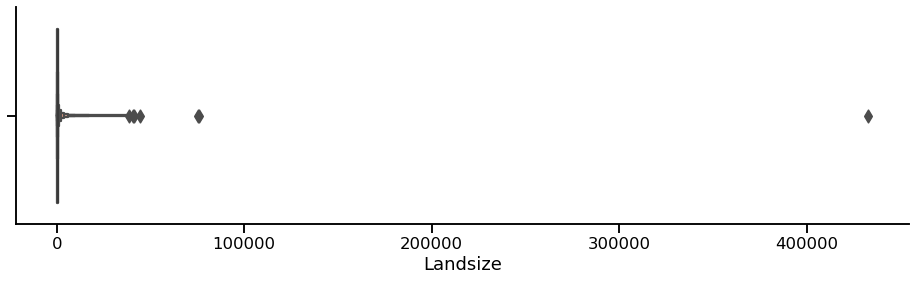

In [25]:
fig = plt.figure(figsize=(16,4))
seaborn.boxenplot(data=melb_df2, x="Landsize", 
                color='orangered')
seaborn.despine()

In [26]:
melb_df2.Landsize.describe()

count     13448.000000
mean        556.029447
std        4009.947593
min           0.000000
25%         174.750000
50%         435.000000
75%         650.000000
max      433014.000000
Name: Landsize, dtype: float64

Nuevamente utilizaremos el **rango intercuartílico** para la detección de outliers y los eliminaremos. 

In [27]:
#Vamos a quitar los outliers de landsize. 400 mil metros cuadrados no es un valor muy posible para el tamaño del terreno. 
q1 = melb_df2.Landsize.quantile(.25)
q3= melb_df2.Landsize.quantile(.75)
iqr = q3 - q1
lower_bound = q1 -(3 * iqr) 
upper_bound = q3 +(3 * iqr) 

print ("el límite inferior es", lower_bound)
print ("el límite superior es", upper_bound)

el límite inferior es -1251.0
el límite superior es 2075.75


In [28]:
max_limit = 2078
melb_df3 = melb_df2[(melb_df2["Landsize"]<=max_limit)]
melb_df3.Landsize.describe()

count    13231.000000
mean       425.627919
std        314.849579
min          0.000000
25%        170.000000
50%        420.000000
75%        644.000000
max       2077.000000
Name: Landsize, dtype: float64

In [29]:
#perdimos 217 casos
len(melb_df3)

13231

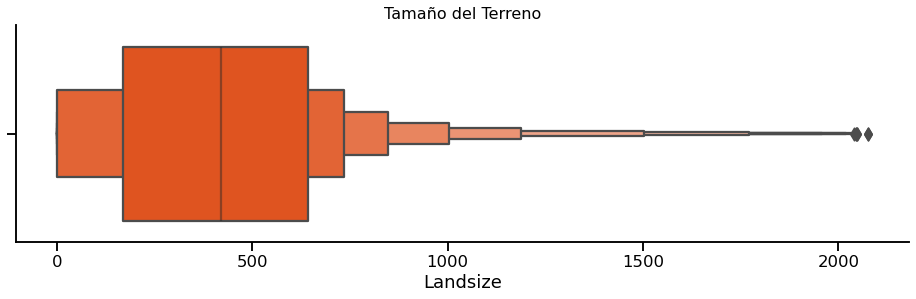

In [30]:
fig = plt.figure(figsize=(16,4))
seaborn.boxenplot(data=melb_df3, x="Landsize", 
                color='orangered')
plt.title('Tamaño del Terreno', size=16)
seaborn.despine()

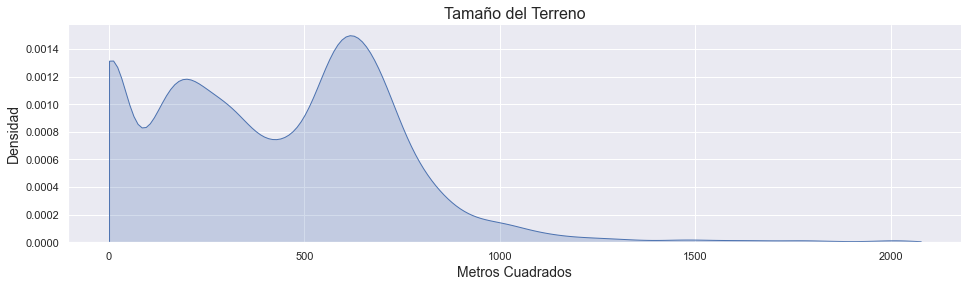

In [31]:
seaborn.set(style="darkgrid")
plt.figure(figsize=(16, 4))
seaborn.kdeplot(data=melb_df3, x="Landsize", common_norm=False, shade=True, cut=0)
plt.title('Tamaño del Terreno', size=16)
plt.xlabel('Metros Cuadrados', size=14)
plt.ylabel('Densidad', size=14)
seaborn.despine()

### Año de Construcción (YearBuilt) y Tamaño de la Propiedad (BuildingArea)

Ambas variables tienen **gran cantidad de datos faltantes**. De todos modos, las conservamos porque las necesitaremos para la próxima parte del trabajo. 

Ambas variables **tienen casos atípicos** (por ejemplo, construcciones de 300 o 400 años de antigüedad o de más de 2 mil o 3 mil metros cuadrados construidos). Sin embargo, para editar estas variables necesitamos hacer antes alguna clase de imputación de los NA (si elimino los casos atípicos también elimino los NA y reduzco el dataset). 


In [32]:
melb_df3.YearBuilt.describe()

count    7983.000000
mean     1964.438181
std        37.062820
min      1196.000000
25%      1940.000000
50%      1970.000000
75%      1998.000000
max      2018.000000
Name: YearBuilt, dtype: float64

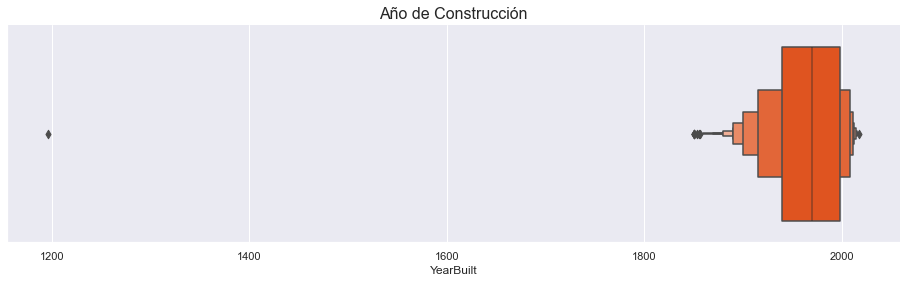

In [33]:
fig = plt.figure(figsize=(16,4))
seaborn.boxenplot(data=melb_df3, x="YearBuilt", 
                color='orangered')
plt.title('Año de Construcción', size=16)
seaborn.despine()

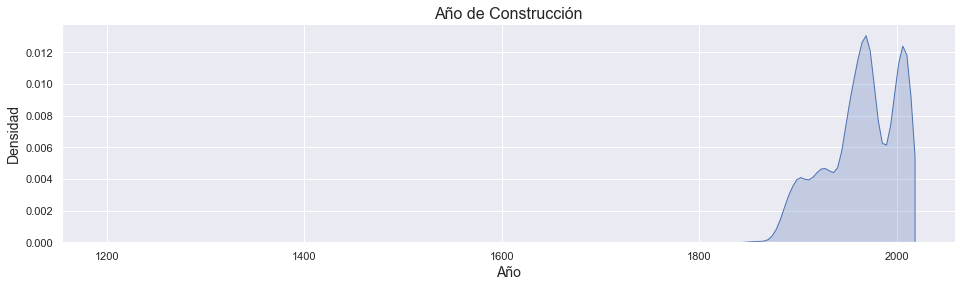

In [34]:
seaborn.set(style="darkgrid")
plt.figure(figsize=(16, 4))
seaborn.kdeplot(data=melb_df3, x="YearBuilt", common_norm=False, shade=True, cut=0)
plt.title('Año de Construcción', size=16)
plt.xlabel('Año', size=14)
plt.ylabel('Densidad', size=14)
seaborn.despine()

In [35]:
melb_df3.BuildingArea.describe()

count    6942.000000
mean      143.907952
std       121.602754
min         0.000000
25%        93.000000
50%       126.000000
75%       172.000000
max      6791.000000
Name: BuildingArea, dtype: float64

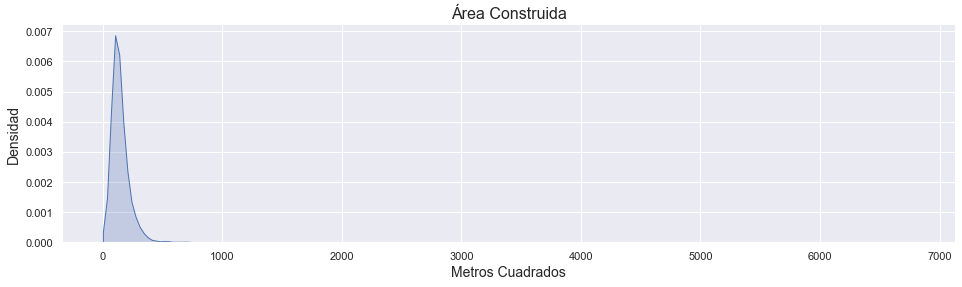

In [36]:
seaborn.set(style="darkgrid")
plt.figure(figsize=(16, 4))
seaborn.kdeplot(data=melb_df3, x="BuildingArea", common_norm=False, shade=True, cut=0)
plt.title('Área Construida', size=16)
plt.xlabel('Metros Cuadrados', size=14)
plt.ylabel('Densidad', size=14)
seaborn.despine()

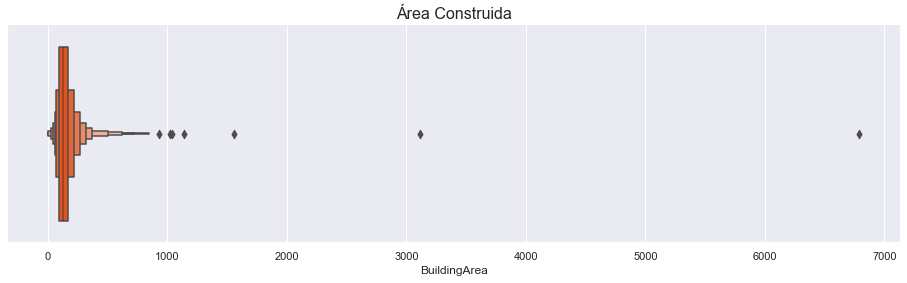

In [37]:
fig = plt.figure(figsize=(16,4))
seaborn.boxenplot(data=melb_df3, x="BuildingArea", 
                color='orangered')
plt.title('Área Construida', size=16)

seaborn.despine()

### Fecha (Date)

Vamos a pasar esta variable a formato fecha y quedarnos solo con el mes y el año

<ipython-input-38-2f718b316c03>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  melb_df3['date'] = pandas.to_datetime(melb_df.Date)


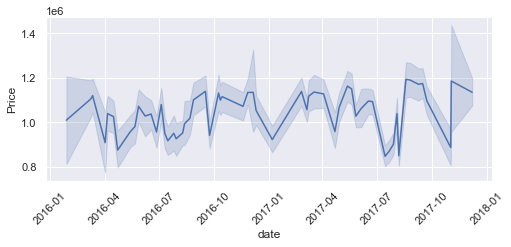

In [38]:
#fecha a formato fecha
fig = plt.figure(figsize=(8, 3))
melb_df3['date'] = pandas.to_datetime(melb_df.Date)
seaborn.lineplot(data=melb_df3, x='date', y='Price')
plt.xticks(rotation=45)
seaborn.despine()

In [39]:
melb_df3['date_month'] = pandas.to_datetime(melb_df3.date.dt.strftime('%Y-%m'))

<ipython-input-39-c117877c3306>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  melb_df3['date_month'] = pandas.to_datetime(melb_df3.date.dt.strftime('%Y-%m'))


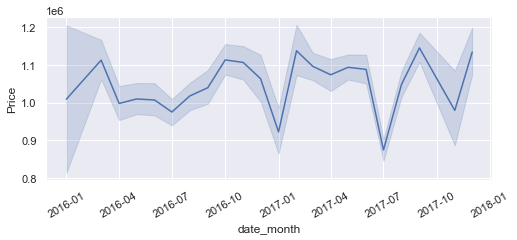

In [40]:
fig = plt.figure(figsize=(8, 3))
seaborn.lineplot(data=melb_df3.sort_values('date_month'), x='date_month', y='Price')
plt.xticks(rotation=30);

Con esto, quedarían editadas las variables que vamos a incluir en nuestro dataset. No hemos trabajado sobre Type, Suburb, Distance, CouncilArea y Postcode porque no identificamos problemas sobre ellas.

Ahora creamos un nuevo dataset que incluye solo las variables que nos interesan

In [41]:
melb_df3['date_month'] = melb_df3['date_month'].dt.to_period('M')
melb_df3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13231 entries, 0 to 13579
Data columns (total 26 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Suburb          13231 non-null  object        
 1   Address         13231 non-null  object        
 2   Rooms           13231 non-null  int64         
 3   Type            13231 non-null  object        
 4   Price           13231 non-null  float64       
 5   Method          13231 non-null  object        
 6   SellerG         13231 non-null  object        
 7   Date            13231 non-null  object        
 8   Distance        13231 non-null  float64       
 9   Postcode        13231 non-null  float64       
 10  Bedroom2        13231 non-null  float64       
 11  Bathroom        13231 non-null  float64       
 12  Car             13172 non-null  float64       
 13  Landsize        13231 non-null  float64       
 14  BuildingArea    6942 non-null   float64       
 15  Ye

<ipython-input-41-83460dd07fc5>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  melb_df3['date_month'] = melb_df3['date_month'].dt.to_period('M')


In [42]:
df_curado = melb_df3 [["Price", "Type", "Rooms_group", "Bathroom_group", "Car_group", "date_month", "YearBuilt", "BuildingArea", "Landsize", "Suburb", "Distance", "CouncilArea", "Postcode"]]
df_curado.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13231 entries, 0 to 13579
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype    
---  ------          --------------  -----    
 0   Price           13231 non-null  float64  
 1   Type            13231 non-null  object   
 2   Rooms_group     13231 non-null  object   
 3   Bathroom_group  13231 non-null  object   
 4   Car_group       13172 non-null  object   
 5   date_month      13231 non-null  period[M]
 6   YearBuilt       7983 non-null   float64  
 7   BuildingArea    6942 non-null   float64  
 8   Landsize        13231 non-null  float64  
 9   Suburb          13231 non-null  object   
 10  Distance        13231 non-null  float64  
 11  CouncilArea     11896 non-null  object   
 12  Postcode        13231 non-null  float64  
dtypes: float64(6), object(6), period[M](1)
memory usage: 1.4+ MB


# Ejercicio 1.3

In [43]:
# 3.A
# Varibles a agregar: media del precio diario de propiedades de la zona, separado por entire home o room (private o shared)
# y promedio del puntaje de la ubicación dado en los reviews

# data source:
# https://www.kaggle.com/tylerx/melbourne-airbnb-open-data?select=cleansed_listings_dec18.csv
interesting_cols = ['id', 'city', 'suburb', 'zipcode', 'room_type', 'price', 'review_scores_location']
airbnb_df = pandas.read_csv(
    'https://cs.famaf.unc.edu.ar/~mteruel/datasets/diplodatos/cleansed_listings_dec18.csv',
    usecols=interesting_cols)

C:\Users\Sofia\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3165: DtypeWarning: Columns (35) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [44]:
airbnb_df.head()

,id,city,suburb,zipcode,room_type,price,review_scores_location
0,9835,Manningham,Bulleen,3105,Private room,60,9.0
1,10803,Moreland,Brunswick East,3057,Private room,35,9.0
2,12936,Port Phillip,St Kilda,3182,Entire home/apt,159,9.0
3,15246,Darebin,Thornbury,3071,Private room,50,9.0
4,16760,Port Phillip,St Kilda East,3183,Private room,69,10.0


In [45]:
# 3.B
airbnb_df['zipcode'] = pandas.to_numeric(airbnb_df.zipcode, errors='coerce')
airbnb_df.replace({'Shared room': 'One room', 'Private room': 'One room'}, inplace=True)
new_info_price = airbnb_df[['zipcode', 'room_type', 'price']].groupby(['zipcode','room_type']).agg(['mean', 'count'])
# Me quedo con los zipcodes que tengan por lo menos 5 apariciones
new_info_price = new_info_price[new_info_price[('price', 'count')]>=5]
new_info_price.reset_index(inplace=True)
new_info_price.drop(axis=1, labels='count', level=1, inplace=True)
new_info_price = new_info_price.droplevel(axis=1, level=1)
new_info_price.rename(columns={'price': 'airbnb_price_mean'}, inplace=True)
new_info_price

,zipcode,room_type,airbnb_price_mean
0,3000.0,Entire home/apt,164.843953
1,3000.0,One room,100.123324
2,3002.0,Entire home/apt,227.606452
3,3002.0,One room,102.714286
4,3003.0,Entire home/apt,160.195531
...,...,...,...
343,3910.0,One room,93.285714
344,3911.0,Entire home/apt,247.666667
345,3975.0,One room,65.600000
346,3977.0,Entire home/apt,154.181818


In [46]:
new_info_price = new_info_price.pivot(index='zipcode', columns='room_type')
new_info_price = new_info_price.droplevel(axis=1, level=0)
new_info_price = new_info_price.rename_axis('', axis=1)
new_info_price.rename(columns={'Entire home/apt': 'airbnb_entire_home_price_mean', 'One room': 'airbnb_one_room_price_mean'}, inplace=True)
new_info_price.reset_index()

,zipcode,airbnb_entire_home_price_mean,airbnb_one_room_price_mean
0,3000.0,164.843953,100.123324
1,3002.0,227.606452,102.714286
2,3003.0,160.195531,69.204545
3,3004.0,178.111111,97.424581
4,3006.0,225.066381,87.580838
...,...,...,...
195,3815.0,377.400000,NaN
196,3910.0,NaN,93.285714
197,3911.0,247.666667,NaN
198,3975.0,NaN,65.600000


In [47]:
new_info_score = airbnb_df[['zipcode', 'review_scores_location']].groupby('zipcode').agg(['mean', 'count'])
new_info_score = new_info_score[new_info_score[('review_scores_location', 'count')]>=5]
new_info_score.reset_index(inplace=True)
new_info_score.drop(axis=1, labels='count', level=1, inplace=True)
new_info_score = new_info_score.droplevel(axis=1, level=1)
new_info_score.rename(columns={'review_scores_location': 'airbnb_location_score_mean'}, inplace=True)
new_info_score

,zipcode,airbnb_location_score_mean
0,3000.0,9.912808
1,3002.0,9.890411
2,3003.0,9.658654
3,3004.0,9.782374
4,3006.0,9.831074
...,...,...
195,3910.0,9.666667
196,3911.0,9.750000
197,3977.0,9.312500
198,3978.0,9.400000


In [48]:
melb = df_curado.merge(new_info_price, how='left', left_on='Postcode', right_on='zipcode')
melb.sample(5)

,Price,Type,Rooms_group,Bathroom_group,Car_group,date_month,YearBuilt,BuildingArea,Landsize,Suburb,Distance,CouncilArea,Postcode,airbnb_entire_home_price_mean,airbnb_one_room_price_mean
8578,1350000.0,h,2,1,1,2017-01,1900.0,79.0,184.0,Fitzroy North,3.6,Yarra,3068.0,161.590426,70.275000
7422,830000.0,h,2,1,1,2017-05,NaN,NaN,153.0,Brunswick,5.2,Moreland,3056.0,133.830189,59.196581
9521,1200000.0,t,3,2,2,2017-06,NaN,NaN,198.0,Ascot Vale,4.3,Moonee Valley,3032.0,164.691358,66.357895
10974,1420000.0,h,3,1,1,2017-07,1965.0,130.0,726.0,Ashwood,10.2,Monash,3147.0,145.555556,54.500000
2700,1600000.0,h,3,2,1,2016-07,1940.0,134.0,704.0,Glen Iris,9.2,Boroondara,3146.0,178.974359,84.848485


In [49]:
melb = melb.merge(new_info_score, how='left', left_on='Postcode', right_on='zipcode')
#no se porque este me agrega la columna zipcode y el merge anterior no, la voy a sacar a mano
melb.drop(axis=1, labels='zipcode', inplace=True)
melb

,Price,Type,Rooms_group,Bathroom_group,Car_group,date_month,YearBuilt,BuildingArea,Landsize,Suburb,Distance,CouncilArea,Postcode,airbnb_entire_home_price_mean,airbnb_one_room_price_mean,airbnb_location_score_mean
0,1480000.0,h,2,1,1,2016-03,NaN,NaN,202.0,Abbotsford,2.5,Yarra,3067.0,171.934641,70.428571,9.697115
1,1035000.0,h,2,1,0,2016-04,1900.0,79.0,156.0,Abbotsford,2.5,Yarra,3067.0,171.934641,70.428571,9.697115
2,1465000.0,h,3,2,0,2017-04,1900.0,150.0,134.0,Abbotsford,2.5,Yarra,3067.0,171.934641,70.428571,9.697115
3,850000.0,h,3,2,1,2017-04,NaN,NaN,94.0,Abbotsford,2.5,Yarra,3067.0,171.934641,70.428571,9.697115
4,1600000.0,h,4,1,2,2016-04,2014.0,142.0,120.0,Abbotsford,2.5,Yarra,3067.0,171.934641,70.428571,9.697115
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13226,1245000.0,h,4,2,2,2017-08,1981.0,NaN,652.0,Wheelers Hill,16.7,NaN,3150.0,219.647887,66.491525,9.466165
13227,1031000.0,h,3,2,2,2017-08,1995.0,133.0,333.0,Williamstown,6.8,NaN,3016.0,205.745763,133.466667,9.717391
13228,1170000.0,h,3,2,3 o más,2017-08,1997.0,NaN,436.0,Williamstown,6.8,NaN,3016.0,205.745763,133.466667,9.717391
13229,2500000.0,h,4,1,3 o más,2017-08,1920.0,157.0,866.0,Williamstown,6.8,NaN,3016.0,205.745763,133.466667,9.717391


In [50]:
# A ver cuantos nan hay en cada columna que agregue:
nan_home = melb.airbnb_entire_home_price_mean.isna().sum()
nan_room = melb.airbnb_one_room_price_mean.isna().sum()
nan_location = melb.airbnb_location_score_mean.isna().sum()
total = len(melb)
print('Valores NaN en airbnb_entire_home_price_mean:', nan_home, '({0:.2f}%)'.format((nan_home/total)*100))
print('Valores NaN en airbnb_one_room_price_mean:', nan_room, '({0:.2f}%)'.format((nan_room/total)*100))
print('Valores NaN en airbnb_location_score_mean:', nan_location, '({0:.2f}%)'.format((nan_location/total)*100))

Valores NaN en airbnb_entire_home_price_mean: 1119 (8.46%)
Valores NaN en airbnb_one_room_price_mean: 419 (3.17%)
Valores NaN en airbnb_location_score_mean: 306 (2.31%)


In [51]:
df_curado = melb

## Ejercicio 2: Imputación

1. Imputar los valores faltantes de la columna CouncilArea en base a la información presente en Suburb. (Si en el punto anterior no seleccionó ninguna de estas variables, agréguelas ahora el conjunto de datos).

2. Imputar los valores faltantes de la(s) columna(s) que se agregaron a partir del conjunto de datos de AirBnB.

### Ejercicio 2.1


In [52]:
# Lo primrero que hago es contar cuantos Suburb y cuantos CouncilArea unicos existen en el datdaset curado
print("Cantidad de Suburb: ",len(df_curado["Suburb"].unique()))
print("Cantidad de CouncilArea: ",len(df_curado["CouncilArea"].unique()))

Cantidad de Suburb:  311
Cantidad de CouncilArea:  34


In [53]:
#Genero una tabla donde cuento cuantas CouncilArea y suburb unicos existen 
count_melb = df_curado[['CouncilArea', 'Suburb']].copy() 
count_melb = count_melb.groupby(['CouncilArea', 'Suburb']).size().to_frame(name = 'count').reset_index()
count_melb
# Tiene 334 filas cuando deberia tener 311.
# Esto es porque algunos suburbios estan asignados a mas de una ciudad

,CouncilArea,Suburb,count
0,Banyule,Bellfield,15
1,Banyule,Briar Hill,5
2,Banyule,Bundoora,13
3,Banyule,Eaglemont,22
4,Banyule,Eltham North,2
...,...,...,...
329,Yarra Ranges,Healesville,1
330,Yarra Ranges,Montrose,1
331,Yarra Ranges,Mooroolbark,9
332,Yarra Ranges,Upwey,1


In [54]:
# Me fijo cuales son los suburbios que pertenecen a mas de un Council Area
frec_suburbs = count_melb.value_counts('Suburb').to_frame('count')
frec_suburbs[frec_suburbs['count']>1].head(10)

,count
Suburb,
Bundoora,3
Fairfield,2
Glen Iris,2
Flemington,2
Brighton East,2
Surrey Hills,2
Port Melbourne,2
Brooklyn,2
Mont Albert,2


In [55]:
# Los ordeno por cantidad de veces que aparecen perteneciendo a cada ciudad
duplicated = list(frec_suburbs[frec_suburbs['count']>1].index)
duplicated = count_melb[count_melb.Suburb.isin(duplicated)].sort_values(['Suburb', 'count'], ascending=[True, False])
duplicated.head(10)

,CouncilArea,Suburb,count
77,Darebin,Alphington,25
317,Yarra,Alphington,7
23,Bayside,Brighton East,124
96,Glen Eira,Brighton East,4
118,Hobsons Bay,Brooklyn,7
45,Brimbank,Brooklyn,1
2,Banyule,Bundoora,13
299,Whittlesea,Bundoora,10
78,Darebin,Bundoora,2
290,Whitehorse,Burwood,61


In [56]:
# Me quedo con la ciudad en la que mas aparecen
not_duplicated = duplicated.drop_duplicates('Suburb')
not_duplicated.head(10)

,CouncilArea,Suburb,count
77,Darebin,Alphington,25
23,Bayside,Brighton East,124
118,Hobsons Bay,Brooklyn,7
2,Banyule,Bundoora,13
290,Whitehorse,Burwood,61
146,Kingston,Cheltenham,26
253,Moreland,Coburg North,53
263,Nillumbik,Eltham North,7
268,Port Phillip,Elwood,121
80,Darebin,Fairfield,35


In [57]:
# Estos son los que ya aparecian en una sola ciudad
uniques = count_melb[count_melb.Suburb.isin(list(frec_suburbs[frec_suburbs['count']==1].index))]
uniques

,CouncilArea,Suburb,count
0,Banyule,Bellfield,15
1,Banyule,Briar Hill,5
3,Banyule,Eaglemont,22
6,Banyule,Heidelberg,48
7,Banyule,Heidelberg Heights,76
...,...,...,...
329,Yarra Ranges,Healesville,1
330,Yarra Ranges,Montrose,1
331,Yarra Ranges,Mooroolbark,9
332,Yarra Ranges,Upwey,1


In [58]:
# Uno ambos, para tener finalmente un dataframe con una ciudad por suburbio
count_melb = pandas.concat([uniques, not_duplicated])
count_melb

,CouncilArea,Suburb,count
0,Banyule,Bellfield,15
1,Banyule,Briar Hill,5
3,Banyule,Eaglemont,22
6,Banyule,Heidelberg,48
7,Banyule,Heidelberg Heights,76
...,...,...,...
83,Darebin,Preston,227
282,Stonnington,South Yarra,146
206,Melbourne,Southbank,31
41,Boroondara,Surrey Hills,64


In [59]:
# Habia 311 suburbios, vamos a unir con esto y si me siguen quedando NaN's me fijo si los 7 que me faltan puedo sacar info de airbnb

In [60]:
#hago un merge left entre el df_curado y count_melb que contiene las columnas que considero relevantes
merged_left = pandas.merge(left = df_curado, right = count_melb, 
                      how = "left", left_on = "Suburb", right_on = "Suburb", suffixes =  (None, '_2'))
len(merged_left)

13231

In [61]:
merged_left

,Price,Type,Rooms_group,Bathroom_group,Car_group,date_month,YearBuilt,BuildingArea,Landsize,Suburb,Distance,CouncilArea,Postcode,airbnb_entire_home_price_mean,airbnb_one_room_price_mean,airbnb_location_score_mean,CouncilArea_2,count
0,1480000.0,h,2,1,1,2016-03,NaN,NaN,202.0,Abbotsford,2.5,Yarra,3067.0,171.934641,70.428571,9.697115,Yarra,53.0
1,1035000.0,h,2,1,0,2016-04,1900.0,79.0,156.0,Abbotsford,2.5,Yarra,3067.0,171.934641,70.428571,9.697115,Yarra,53.0
2,1465000.0,h,3,2,0,2017-04,1900.0,150.0,134.0,Abbotsford,2.5,Yarra,3067.0,171.934641,70.428571,9.697115,Yarra,53.0
3,850000.0,h,3,2,1,2017-04,NaN,NaN,94.0,Abbotsford,2.5,Yarra,3067.0,171.934641,70.428571,9.697115,Yarra,53.0
4,1600000.0,h,4,1,2,2016-04,2014.0,142.0,120.0,Abbotsford,2.5,Yarra,3067.0,171.934641,70.428571,9.697115,Yarra,53.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13226,1245000.0,h,4,2,2,2017-08,1981.0,NaN,652.0,Wheelers Hill,16.7,NaN,3150.0,219.647887,66.491525,9.466165,Monash,13.0
13227,1031000.0,h,3,2,2,2017-08,1995.0,133.0,333.0,Williamstown,6.8,NaN,3016.0,205.745763,133.466667,9.717391,Hobsons Bay,100.0
13228,1170000.0,h,3,2,3 o más,2017-08,1997.0,NaN,436.0,Williamstown,6.8,NaN,3016.0,205.745763,133.466667,9.717391,Hobsons Bay,100.0
13229,2500000.0,h,4,1,3 o más,2017-08,1920.0,157.0,866.0,Williamstown,6.8,NaN,3016.0,205.745763,133.466667,9.717391,Hobsons Bay,100.0


In [62]:
#cuento los valores nulos
missing_values_count_melb_left = merged_left.isna().sum()
missing_values_count_melb_left.loc[['CouncilArea', 'CouncilArea_2']]

CouncilArea      1335
CouncilArea_2       8
dtype: int64

In [63]:
#marcando las columnas que necesito con etiquetas de destino 
merged_left.loc[merged_left.CouncilArea.isna(), 'CouncilArea'] = merged_left.loc[merged_left.CouncilArea.isna(), 'CouncilArea_2']
merged_left

,Price,Type,Rooms_group,Bathroom_group,Car_group,date_month,YearBuilt,BuildingArea,Landsize,Suburb,Distance,CouncilArea,Postcode,airbnb_entire_home_price_mean,airbnb_one_room_price_mean,airbnb_location_score_mean,CouncilArea_2,count
0,1480000.0,h,2,1,1,2016-03,NaN,NaN,202.0,Abbotsford,2.5,Yarra,3067.0,171.934641,70.428571,9.697115,Yarra,53.0
1,1035000.0,h,2,1,0,2016-04,1900.0,79.0,156.0,Abbotsford,2.5,Yarra,3067.0,171.934641,70.428571,9.697115,Yarra,53.0
2,1465000.0,h,3,2,0,2017-04,1900.0,150.0,134.0,Abbotsford,2.5,Yarra,3067.0,171.934641,70.428571,9.697115,Yarra,53.0
3,850000.0,h,3,2,1,2017-04,NaN,NaN,94.0,Abbotsford,2.5,Yarra,3067.0,171.934641,70.428571,9.697115,Yarra,53.0
4,1600000.0,h,4,1,2,2016-04,2014.0,142.0,120.0,Abbotsford,2.5,Yarra,3067.0,171.934641,70.428571,9.697115,Yarra,53.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13226,1245000.0,h,4,2,2,2017-08,1981.0,NaN,652.0,Wheelers Hill,16.7,Monash,3150.0,219.647887,66.491525,9.466165,Monash,13.0
13227,1031000.0,h,3,2,2,2017-08,1995.0,133.0,333.0,Williamstown,6.8,Hobsons Bay,3016.0,205.745763,133.466667,9.717391,Hobsons Bay,100.0
13228,1170000.0,h,3,2,3 o más,2017-08,1997.0,NaN,436.0,Williamstown,6.8,Hobsons Bay,3016.0,205.745763,133.466667,9.717391,Hobsons Bay,100.0
13229,2500000.0,h,4,1,3 o más,2017-08,1920.0,157.0,866.0,Williamstown,6.8,Hobsons Bay,3016.0,205.745763,133.466667,9.717391,Hobsons Bay,100.0


In [64]:
missing_values_count_melb_left = merged_left.isna().sum()
missing_values_count_melb_left.loc[['CouncilArea', 'CouncilArea_2']]

CouncilArea      8
CouncilArea_2    8
dtype: int64

In [65]:
# Voy a intentar imputar los 8 valores restantes con el dataset de airbnb

In [66]:
#importo y selecciono las columnas relevantes del dataset llamado airbnb_df
column_relevant_airbnb = ['city', 'suburb']

In [67]:
airbnb_df[column_relevant_airbnb].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22895 entries, 0 to 22894
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   city    22895 non-null  object
 1   suburb  22872 non-null  object
dtypes: object(2)
memory usage: 357.9+ KB


In [68]:
#Genero una tabla donde cuento cuantas city y suburb unicos existen 
count_airbnb = airbnb_df[column_relevant_airbnb].copy() 
count_airbnb = count_airbnb.groupby(['city', 'suburb']).size().to_frame(name = 'count').reset_index()
count_airbnb

,city,suburb,count
0,Banyule,Bellfield,2
1,Banyule,Briar Hill,1
2,Banyule,Bundoora,23
3,Banyule,Eaglemont,5
4,Banyule,Greensborough,8
...,...,...,...
676,Yarra Ranges,Yarra Ranges Shire,1
677,Yarra Ranges,"Yarra Valley, Yarra Glen, Healesville",1
678,Yarra Ranges,Yellingbo,3
679,Yarra Ranges,"Yellingbo, Yarra Valley",1


In [69]:
# Me quedo solo con los que me faltan
left_to_fill = list(set(df_curado.Suburb).intersection(set(merged_left[merged_left.CouncilArea.isna()]['Suburb'])))
count_airbnb = count_airbnb[count_airbnb['suburb'].isin(left_to_fill)]
count_airbnb

,city,suburb,count
204,Hume,Attwood,1
355,Melton,Burnside,1
366,Melton,Plumpton,4
452,Nillumbik,North Warrandyte,6
642,Yarra Ranges,Monbulk,8
646,Yarra Ranges,Mount Evelyn,7


In [70]:
# Sigue faltando Wallan, pero no hay nada que pueda hacer, y tampoco importa mucho porque es solo una fila
df_curado[df_curado.Suburb=='Wallan']

,Price,Type,Rooms_group,Bathroom_group,Car_group,date_month,YearBuilt,BuildingArea,Landsize,Suburb,Distance,CouncilArea,Postcode,airbnb_entire_home_price_mean,airbnb_one_room_price_mean,airbnb_location_score_mean
12530,366000.0,h,3,1,1,2017-09,1978.0,77.0,502.0,Wallan,44.2,NaN,3756.0,NaN,NaN,NaN


In [71]:
# hacemos un merge como antes
merged_left = pandas.merge(left = merged_left, right = count_airbnb, 
                      how = "left", left_on = "Suburb", right_on = "suburb")
len(merged_left)

13231

In [72]:
#marcando las columnas que necesito con etiquetas de destino 
merged_left.loc[merged_left.CouncilArea.isna(), 'CouncilArea'] = merged_left.loc[merged_left.CouncilArea.isna(), 'city']
# Tiro las columnas que agregué demas
merged_left.drop(columns=['CouncilArea_2', 'count_x', 'city', 'suburb', 'count_y'], inplace=True)
merged_left

,Price,Type,Rooms_group,Bathroom_group,Car_group,date_month,YearBuilt,BuildingArea,Landsize,Suburb,Distance,CouncilArea,Postcode,airbnb_entire_home_price_mean,airbnb_one_room_price_mean,airbnb_location_score_mean
0,1480000.0,h,2,1,1,2016-03,NaN,NaN,202.0,Abbotsford,2.5,Yarra,3067.0,171.934641,70.428571,9.697115
1,1035000.0,h,2,1,0,2016-04,1900.0,79.0,156.0,Abbotsford,2.5,Yarra,3067.0,171.934641,70.428571,9.697115
2,1465000.0,h,3,2,0,2017-04,1900.0,150.0,134.0,Abbotsford,2.5,Yarra,3067.0,171.934641,70.428571,9.697115
3,850000.0,h,3,2,1,2017-04,NaN,NaN,94.0,Abbotsford,2.5,Yarra,3067.0,171.934641,70.428571,9.697115
4,1600000.0,h,4,1,2,2016-04,2014.0,142.0,120.0,Abbotsford,2.5,Yarra,3067.0,171.934641,70.428571,9.697115
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13226,1245000.0,h,4,2,2,2017-08,1981.0,NaN,652.0,Wheelers Hill,16.7,Monash,3150.0,219.647887,66.491525,9.466165
13227,1031000.0,h,3,2,2,2017-08,1995.0,133.0,333.0,Williamstown,6.8,Hobsons Bay,3016.0,205.745763,133.466667,9.717391
13228,1170000.0,h,3,2,3 o más,2017-08,1997.0,NaN,436.0,Williamstown,6.8,Hobsons Bay,3016.0,205.745763,133.466667,9.717391
13229,2500000.0,h,4,1,3 o más,2017-08,1920.0,157.0,866.0,Williamstown,6.8,Hobsons Bay,3016.0,205.745763,133.466667,9.717391


In [73]:
missing_values_count_melb_left = merged_left.isna().sum()
missing_values_count_melb_left

Price                               0
Type                                0
Rooms_group                         0
Bathroom_group                      0
Car_group                          59
date_month                          0
YearBuilt                        5248
BuildingArea                     6289
Landsize                            0
Suburb                              0
Distance                            0
CouncilArea                         1
Postcode                            0
airbnb_entire_home_price_mean    1119
airbnb_one_room_price_mean        419
airbnb_location_score_mean        306
dtype: int64

In [74]:
df_curado = merged_left

### Ejercicio 2.2

In [75]:
# 2.2
# Voy a imputar por el promedio agrupado por CouncilArea (se puede ver en el reporte que estan correlacionadas con CouncilArea)

relevant_cols = ['CouncilArea', 'airbnb_entire_home_price_mean', 'airbnb_one_room_price_mean', 'airbnb_location_score_mean']
average_per_council_area = df_curado[relevant_cols].groupby('CouncilArea').mean()
average_per_council_area.rename(columns={'airbnb_entire_home_price_mean': 'home_mean_CA', 'airbnb_one_room_price_mean': 'room_mean_CA', 'airbnb_location_score_mean': 'location_mean_CA'}, inplace=True)
average_per_council_area.reset_index(inplace=True)
average_per_council_area.head()
# Ahora average_per_council_area tiene 2 NaN, o sea, que estarian faltando datos para 2 Council Areas

,CouncilArea,home_mean_CA,room_mean_CA,location_mean_CA
0,Banyule,153.630431,55.182246,9.300383
1,Bayside,307.312298,88.759407,9.558500
2,Boroondara,192.637496,113.934295,9.581299
3,Brimbank,138.052400,50.833800,9.016025
4,Cardinia,158.404412,84.982784,9.806495


In [76]:
melb = df_curado.merge(average_per_council_area, how='left', left_on='CouncilArea', right_on='CouncilArea')
melb.sample(10, random_state=7)

,Price,Type,Rooms_group,Bathroom_group,Car_group,date_month,YearBuilt,BuildingArea,Landsize,Suburb,Distance,CouncilArea,Postcode,airbnb_entire_home_price_mean,airbnb_one_room_price_mean,airbnb_location_score_mean,home_mean_CA,room_mean_CA,location_mean_CA
1302,1815000.0,h,3,1,3 o más,2016-06,NaN,NaN,612.0,Brunswick,5.2,Moreland,3056.0,133.830189,59.196581,9.640719,135.033652,58.809560,9.372600
4413,770000.0,t,3,2,2,2017-11,2012.0,138.0,272.0,Oak Park,11.5,Moreland,3046.0,99.294118,57.069767,9.166667,135.033652,58.809560,9.372600
7044,1074000.0,h,3,2,2,2016-03,1950.0,NaN,355.0,West Footscray,8.2,Maribyrnong,3012.0,148.866667,60.032258,9.035714,154.142971,61.409575,9.267424
10177,640000.0,u,2,1,1,2017-05,NaN,NaN,0.0,Ormond,11.4,Glen Eira,3204.0,194.354839,64.163265,9.692308,173.293386,66.161807,9.535320
12030,900000.0,h,4,2,2,2017-03,1980.0,216.0,530.0,Mentone,20.0,Kingston,3194.0,209.461538,61.250000,9.777778,174.499070,68.311264,9.411432
5588,1250000.0,u,4,3 o más,1,2016-12,2000.0,176.0,0.0,Southbank,1.2,Melbourne,3006.0,225.066381,87.580838,9.831074,170.115353,76.504568,9.727402
5314,531000.0,t,2,1,1,2016-10,1990.0,89.0,83.0,Rosanna,11.4,Banyule,3084.0,169.909091,60.107143,9.298246,153.630431,55.182246,9.300383
12244,1341500.0,h,3,1,1,2017-09,1950.0,NaN,272.0,Northcote,5.3,Darebin,3070.0,143.500000,60.980769,9.787037,289.646284,75.711851,9.397041
3623,1315000.0,h,4,2,2,2016-09,1930.0,200.0,458.0,Kew East,7.5,Boroondara,3102.0,153.200000,1191.857143,9.111111,192.637496,113.934295,9.581299
7158,1641000.0,h,4,1,2,2016-11,NaN,NaN,802.0,Oakleigh,14.0,Monash,3166.0,226.043478,57.893617,9.404255,202.600528,57.602585,9.375443


In [77]:
melb.airbnb_entire_home_price_mean.fillna(melb.home_mean_CA, inplace=True)
melb.airbnb_one_room_price_mean.fillna(melb.room_mean_CA, inplace=True)
melb.airbnb_location_score_mean.fillna(melb.location_mean_CA, inplace=True)
melb.drop(columns=['home_mean_CA', 'room_mean_CA', 'location_mean_CA'] , inplace=True)
melb.sample(10, random_state=7)

,Price,Type,Rooms_group,Bathroom_group,Car_group,date_month,YearBuilt,BuildingArea,Landsize,Suburb,Distance,CouncilArea,Postcode,airbnb_entire_home_price_mean,airbnb_one_room_price_mean,airbnb_location_score_mean
1302,1815000.0,h,3,1,3 o más,2016-06,NaN,NaN,612.0,Brunswick,5.2,Moreland,3056.0,133.830189,59.196581,9.640719
4413,770000.0,t,3,2,2,2017-11,2012.0,138.0,272.0,Oak Park,11.5,Moreland,3046.0,99.294118,57.069767,9.166667
7044,1074000.0,h,3,2,2,2016-03,1950.0,NaN,355.0,West Footscray,8.2,Maribyrnong,3012.0,148.866667,60.032258,9.035714
10177,640000.0,u,2,1,1,2017-05,NaN,NaN,0.0,Ormond,11.4,Glen Eira,3204.0,194.354839,64.163265,9.692308
12030,900000.0,h,4,2,2,2017-03,1980.0,216.0,530.0,Mentone,20.0,Kingston,3194.0,209.461538,61.250000,9.777778
5588,1250000.0,u,4,3 o más,1,2016-12,2000.0,176.0,0.0,Southbank,1.2,Melbourne,3006.0,225.066381,87.580838,9.831074
5314,531000.0,t,2,1,1,2016-10,1990.0,89.0,83.0,Rosanna,11.4,Banyule,3084.0,169.909091,60.107143,9.298246
12244,1341500.0,h,3,1,1,2017-09,1950.0,NaN,272.0,Northcote,5.3,Darebin,3070.0,143.500000,60.980769,9.787037
3623,1315000.0,h,4,2,2,2016-09,1930.0,200.0,458.0,Kew East,7.5,Boroondara,3102.0,153.200000,1191.857143,9.111111
7158,1641000.0,h,4,1,2,2016-11,NaN,NaN,802.0,Oakleigh,14.0,Monash,3166.0,226.043478,57.893617,9.404255


In [78]:
# A ver si siguen quedando nan en las columnas agregadas:
nan_home = melb.airbnb_entire_home_price_mean.isna().sum()
nan_room = melb.airbnb_one_room_price_mean.isna().sum()
nan_location = melb.airbnb_location_score_mean.isna().sum()
total = len(melb)
print('Valores NaN en airbnb_entire_home_price_mean:', nan_home, '({0:.2f}%)'.format((nan_home/total)*100))
print('Valores NaN en airbnb_one_room_price_mean:', nan_room, '({0:.2f}%)'.format((nan_room/total)*100))
print('Valores NaN en airbnb_location_score_mean:', nan_location, '({0:.2f}%)'.format((nan_location/total)*100))

Valores NaN en airbnb_entire_home_price_mean: 8 (0.06%)
Valores NaN en airbnb_one_room_price_mean: 8 (0.06%)
Valores NaN en airbnb_location_score_mean: 8 (0.06%)


In [79]:
# Son muy poquitos asi que podemos eliminar las filas
df_curado = melb
df_curado.isna().sum()

Price                               0
Type                                0
Rooms_group                         0
Bathroom_group                      0
Car_group                          59
date_month                          0
YearBuilt                        5248
BuildingArea                     6289
Landsize                            0
Suburb                              0
Distance                            0
CouncilArea                         1
Postcode                            0
airbnb_entire_home_price_mean       8
airbnb_one_room_price_mean          8
airbnb_location_score_mean          8
dtype: int64

In [80]:
# Eliminamos las filas que tienen valores Nan en Car_group, CouncilArea y las agragadas de airbnb, son solo 67 (0.5% del total)
df_curado = df_curado.dropna(subset=['Car_group', 'CouncilArea', 
                                     'airbnb_entire_home_price_mean', 'airbnb_one_room_price_mean', 'airbnb_location_score_mean'])
df_curado

,Price,Type,Rooms_group,Bathroom_group,Car_group,date_month,YearBuilt,BuildingArea,Landsize,Suburb,Distance,CouncilArea,Postcode,airbnb_entire_home_price_mean,airbnb_one_room_price_mean,airbnb_location_score_mean
0,1480000.0,h,2,1,1,2016-03,NaN,NaN,202.0,Abbotsford,2.5,Yarra,3067.0,171.934641,70.428571,9.697115
1,1035000.0,h,2,1,0,2016-04,1900.0,79.0,156.0,Abbotsford,2.5,Yarra,3067.0,171.934641,70.428571,9.697115
2,1465000.0,h,3,2,0,2017-04,1900.0,150.0,134.0,Abbotsford,2.5,Yarra,3067.0,171.934641,70.428571,9.697115
3,850000.0,h,3,2,1,2017-04,NaN,NaN,94.0,Abbotsford,2.5,Yarra,3067.0,171.934641,70.428571,9.697115
4,1600000.0,h,4,1,2,2016-04,2014.0,142.0,120.0,Abbotsford,2.5,Yarra,3067.0,171.934641,70.428571,9.697115
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13226,1245000.0,h,4,2,2,2017-08,1981.0,NaN,652.0,Wheelers Hill,16.7,Monash,3150.0,219.647887,66.491525,9.466165
13227,1031000.0,h,3,2,2,2017-08,1995.0,133.0,333.0,Williamstown,6.8,Hobsons Bay,3016.0,205.745763,133.466667,9.717391
13228,1170000.0,h,3,2,3 o más,2017-08,1997.0,NaN,436.0,Williamstown,6.8,Hobsons Bay,3016.0,205.745763,133.466667,9.717391
13229,2500000.0,h,4,1,3 o más,2017-08,1920.0,157.0,866.0,Williamstown,6.8,Hobsons Bay,3016.0,205.745763,133.466667,9.717391


## Ejercicio 3

Crear y guardar un nuevo conjunto de datos con todas las transformaciones realizadas anteriormente.

In [81]:
# Grabamos dataframe resultante
df_curado.to_csv('dataset_new.csv', index=False)